# **Importing library&function**






In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, mean_squared_error, auc
from IPython.core.display import display, HTML
import numpy as np
import time
import os
from google.colab import drive
import itertools

!pip install split_folders
import splitfolders

!pip install scikit-learn

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/
loc = "/content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/"

cataract  diabetic_retinopathy	glaucoma  normal


In [4]:
splitfolders.ratio(loc,output = "output1",ratio = (0.80,0.10,0.10))
for dirpath,dirname,filename in os.walk("./output1"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

Copying files: 4217 files [01:16, 55.28 files/s] 

There are 3 directories and 0 images in './output1'.
There are 4 directories and 0 images in './output1/train'.
There are 0 directories and 830 images in './output1/train/cataract'.
There are 0 directories and 805 images in './output1/train/glaucoma'.
There are 0 directories and 859 images in './output1/train/normal'.
There are 0 directories and 878 images in './output1/train/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/test'.
There are 0 directories and 105 images in './output1/test/cataract'.
There are 0 directories and 102 images in './output1/test/glaucoma'.
There are 0 directories and 108 images in './output1/test/normal'.
There are 0 directories and 111 images in './output1/test/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/val'.
There are 0 directories and 103 images in './output1/val/cataract'.
There are 0 directories and 100 images in './output1/val/glaucoma'.
There are 0 directories and 107 images in './output1/val/norm

In [5]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [6]:
data_aug = tf.keras.Sequential([
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomHeight(0.2),
    # preprocessing.RandomRotation(0.2),
    # preprocessing.RandomFlip("horizontal")
],name = "data_augmentation_layer")

In [7]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **Batch Size: 16**

In [8]:
epoch = 20
batchsize = 16

In [9]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [10]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


52606240/52606240 [==============================] - 2s 0us/step


In [11]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d (  (None, 1536)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 32)                49184     
                                                             

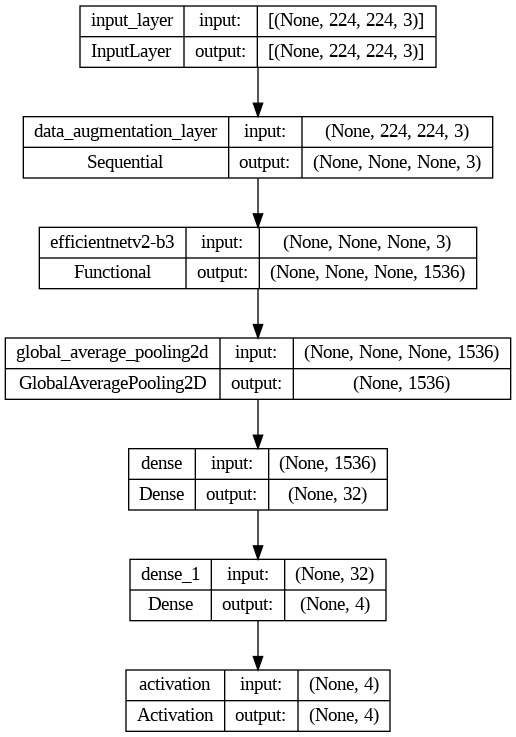

In [12]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [13]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [14]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 116s 487ms/step - loss: 0.6773 - accuracy: 0.7278 - val_loss: 0.4227 - val_accuracy: 0.8305 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 81s 381ms/step - loss: 0.4750 - accuracy: 0.8185 - val_loss: 0.3612 - val_accuracy: 0.8616 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 67s 316ms/step - loss: 0.4346 - accuracy: 0.8295 - val_loss: 0.4293 - val_accuracy: 0.8473 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 69s 327ms/step - loss: 0.4054 - accuracy: 0.8440 - val_loss: 0.3050 - val_accuracy: 0.9021 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 57s 268ms/step - loss: 0.3737 - accuracy: 0.8559 - val_loss: 0.3386 - val_accuracy: 0.8711 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 52s 245ms/step - loss: 0.3543 - accuracy: 0.8695 - val_loss: 0.3453 - val_accuracy: 0.8663 - lr: 0.0010
Epoch 7/20
211/211 [==============================]

EfficientNetV2B3 Evaluation

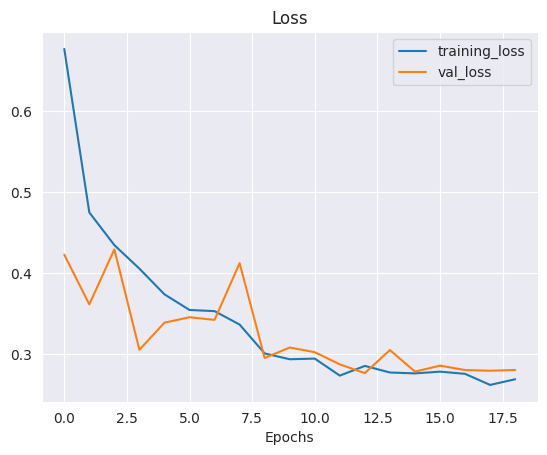

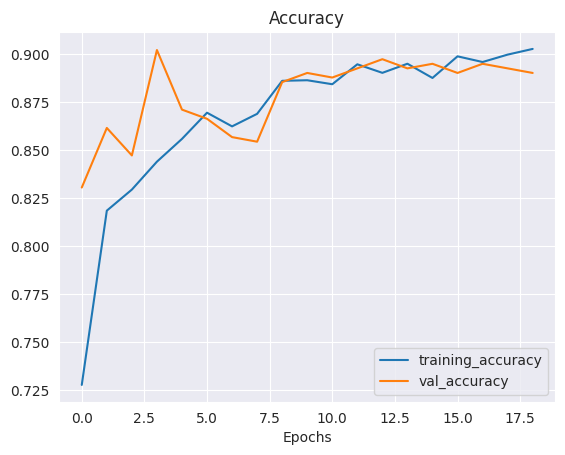

In [15]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 43ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       105
           1       0.96      0.99      0.97       111
           2       0.93      0.80      0.86       102
           3       0.87      0.94      0.91       108

    accuracy                           0.92       426
   macro avg       0.93      0.92      0.92       426
weighted avg       0.93      0.92      0.92       426

Specificity: [0.3067484662576687, 0.34810126582278483, 0.23837209302325582, 0.3148148148148148]
Mean Squared Error: : 0.10883914679288864
The average AUC-ROC is 0.9877084012257604


[0.984375,
 0.662379421221865,
 0.6982248520710059,
 0.6666666666666666,
 0.653125,
 0.9967845659163987,
 0.6715976331360947,
 0.6440129449838188,
 0.696875,
 0.6816720257234726,
 0.9408284023668639,
 0.7087378640776699,
 0.665625,
 0.6591639871382636,
 0.6893491124260355,
 0.9805825242718447]

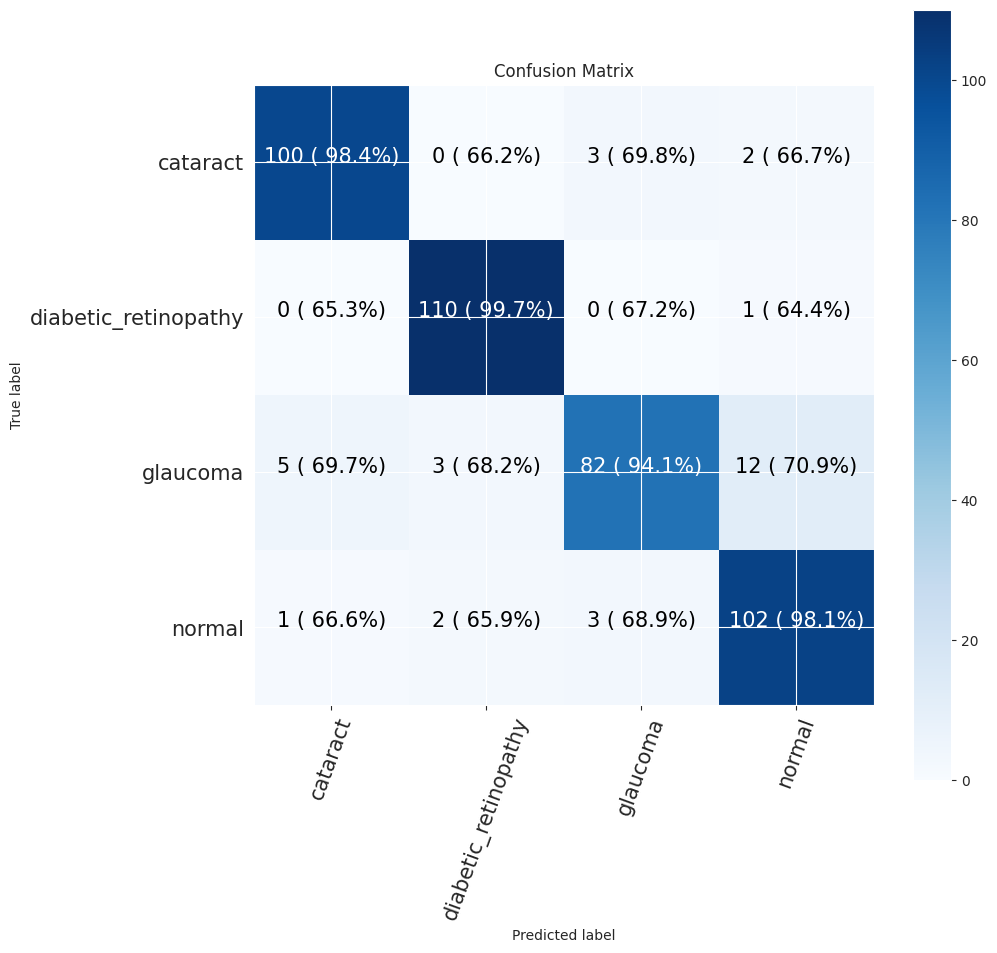

In [16]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


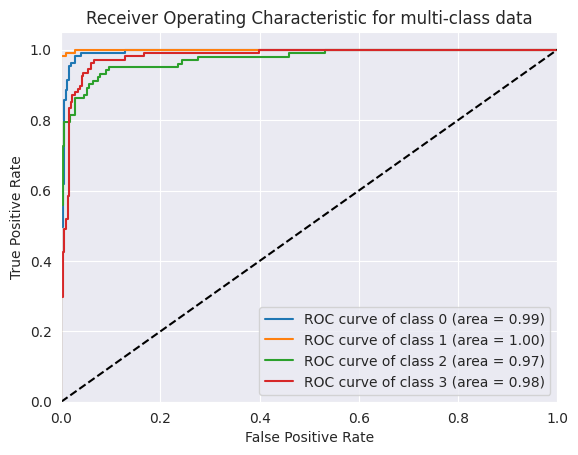

In [17]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [18]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [19]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

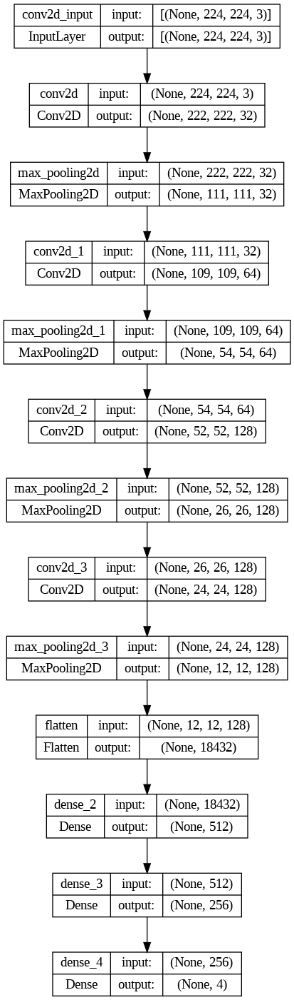

In [20]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [21]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [22]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 9s 26ms/step - loss: 0.6682 - accuracy: 0.5922 - val_loss: 0.3075 - val_accuracy: 0.7112 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 5s 22ms/step - loss: 0.3066 - accuracy: 0.6856 - val_loss: 0.3031 - val_accuracy: 0.7351 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 5s 22ms/step - loss: 0.2878 - accuracy: 0.7088 - val_loss: 0.2752 - val_accuracy: 0.7542 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 5s 22ms/step - loss: 0.2748 - accuracy: 0.7150 - val_loss: 0.2629 - val_accuracy: 0.7661 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 5s 22ms/step - loss: 0.2695 - accuracy: 0.7230 - val_loss: 0.2586 - val_accuracy: 0.7613 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 5s 22ms/step - loss: 0.2640 - accuracy: 0.7310 - val_loss: 0.2693 - val_accuracy: 0.7399 - lr: 0.0010
Epoch 7/20
211/211 [==============================] - 5s 22ms/st

CNN Evaluation

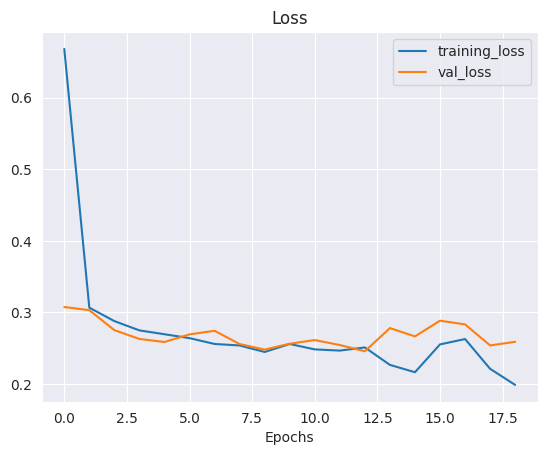

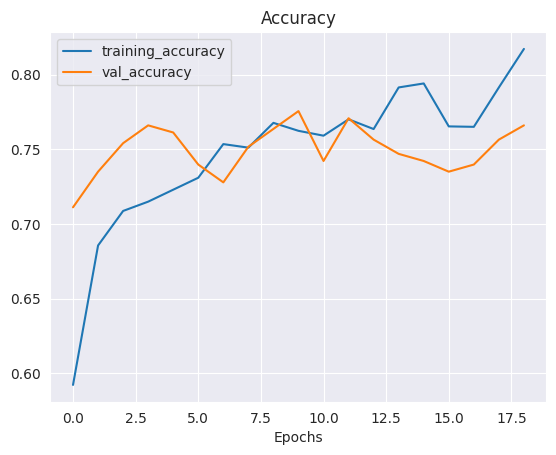

In [23]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 0s 9ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.53      0.56       105
           1       1.00      0.99      1.00       111
           2       0.56      0.52      0.54       102
           3       0.71      0.83      0.77       108

    accuracy                           0.73       426
   macro avg       0.72      0.72      0.72       426
weighted avg       0.72      0.73      0.72       426

Specificity: [0.15135135135135136, 0.34810126582278483, 0.14209115281501342, 0.26785714285714285]
Mean Squared Error: : 0.13294585049152374
The average AUC-ROC is 0.8888407434108141


[0.8524096385542169,
 0.6677215189873418,
 0.7673716012084593,
 0.7190635451505016,
 0.6656626506024096,
 0.9968354430379747,
 0.6676737160120846,
 0.6287625418060201,
 0.7921686746987951,
 0.6772151898734177,
 0.851963746223565,
 0.7123745819397993,
 0.6897590361445783,
 0.6582278481012658,
 0.7129909365558912,
 0.939799331103679]

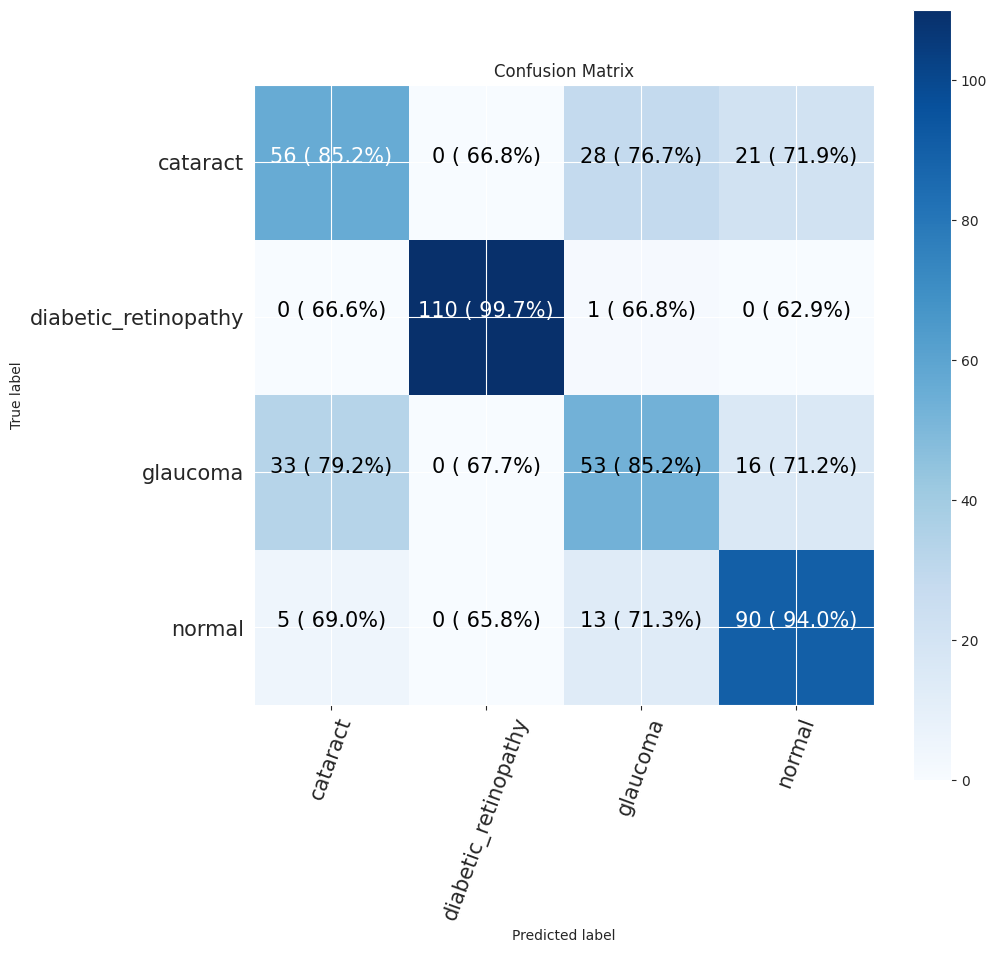

In [24]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


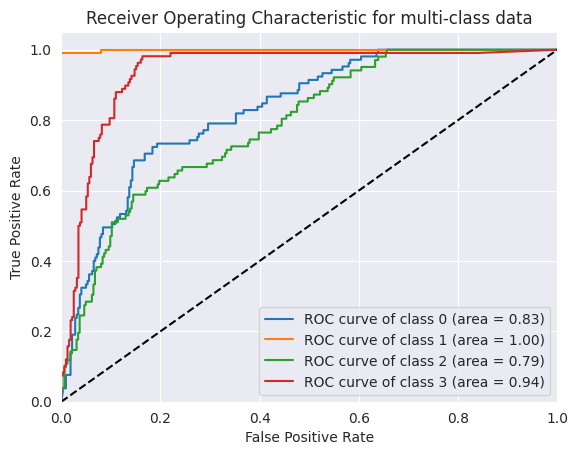

In [25]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [26]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [27]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


94765736/94765736 [==============================] - 3s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d_4 (Conv2D)           (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_5 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_6 (Dense)             (None, 4)                 4100 

In [28]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

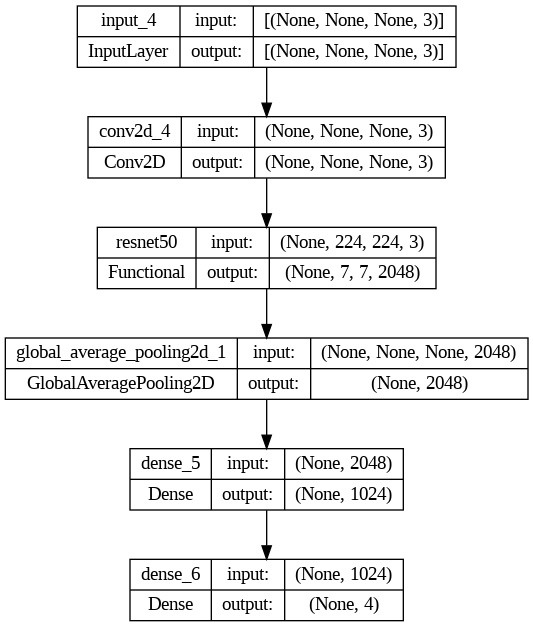

In [29]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [30]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [31]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 41s 159ms/step - loss: 0.2567 - accuracy: 0.8007 - val_loss: 0.1702 - val_accuracy: 0.8807 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 29s 138ms/step - loss: 0.1655 - accuracy: 0.8674 - val_loss: 0.1512 - val_accuracy: 0.9093 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 29s 137ms/step - loss: 0.1457 - accuracy: 0.8843 - val_loss: 0.1309 - val_accuracy: 0.8854 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 29s 138ms/step - loss: 0.1261 - accuracy: 0.9007 - val_loss: 0.1524 - val_accuracy: 0.9021 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 29s 138ms/step - loss: 0.1164 - accuracy: 0.9054 - val_loss: 0.1260 - val_accuracy: 0.8878 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 29s 138ms/step - loss: 0.1049 - accuracy: 0.9205 - val_loss: 0.1140 - val_accuracy: 0.9165 - lr: 0.0010
Epoch 7/20
211/211 [==============================] 

ResNet50 Evaluation

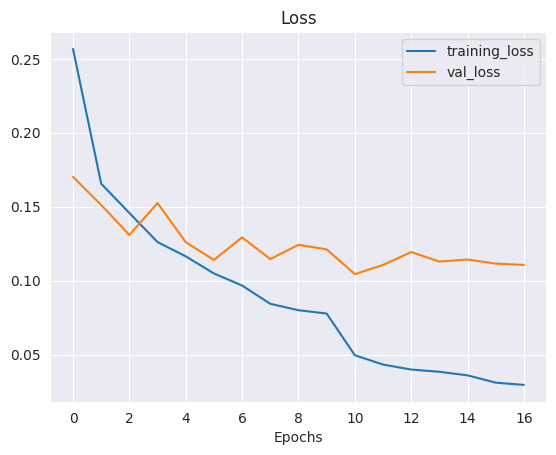

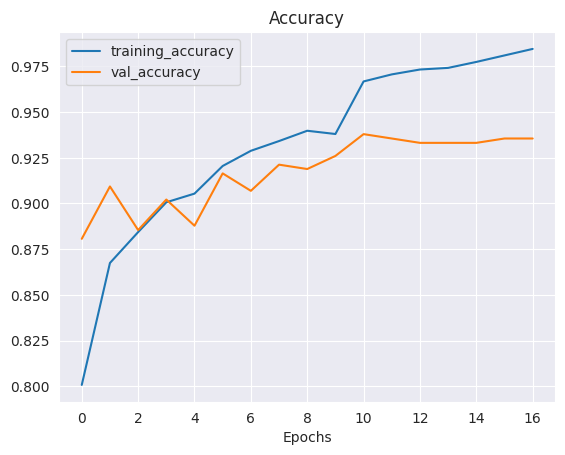

In [32]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 49ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       105
           1       1.00      0.99      1.00       111
           2       0.87      0.87      0.87       102
           3       0.87      0.86      0.87       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.92      0.92      0.92       426

Specificity: [0.3067484662576687, 0.34810126582278483, 0.26409495548961426, 0.27927927927927926]
Mean Squared Error: : 0.10348260402679443
The average AUC-ROC is 0.990810566050755


[0.9843260188087775,
 0.6677215189873418,
 0.6851851851851852,
 0.677115987460815,
 0.6551724137931034,
 0.9968354430379747,
 0.6574074074074074,
 0.6520376175548589,
 0.6833855799373041,
 0.6772151898734177,
 0.9598765432098766,
 0.7178683385579937,
 0.677115987460815,
 0.6582278481012658,
 0.6975308641975309,
 0.9529780564263323]

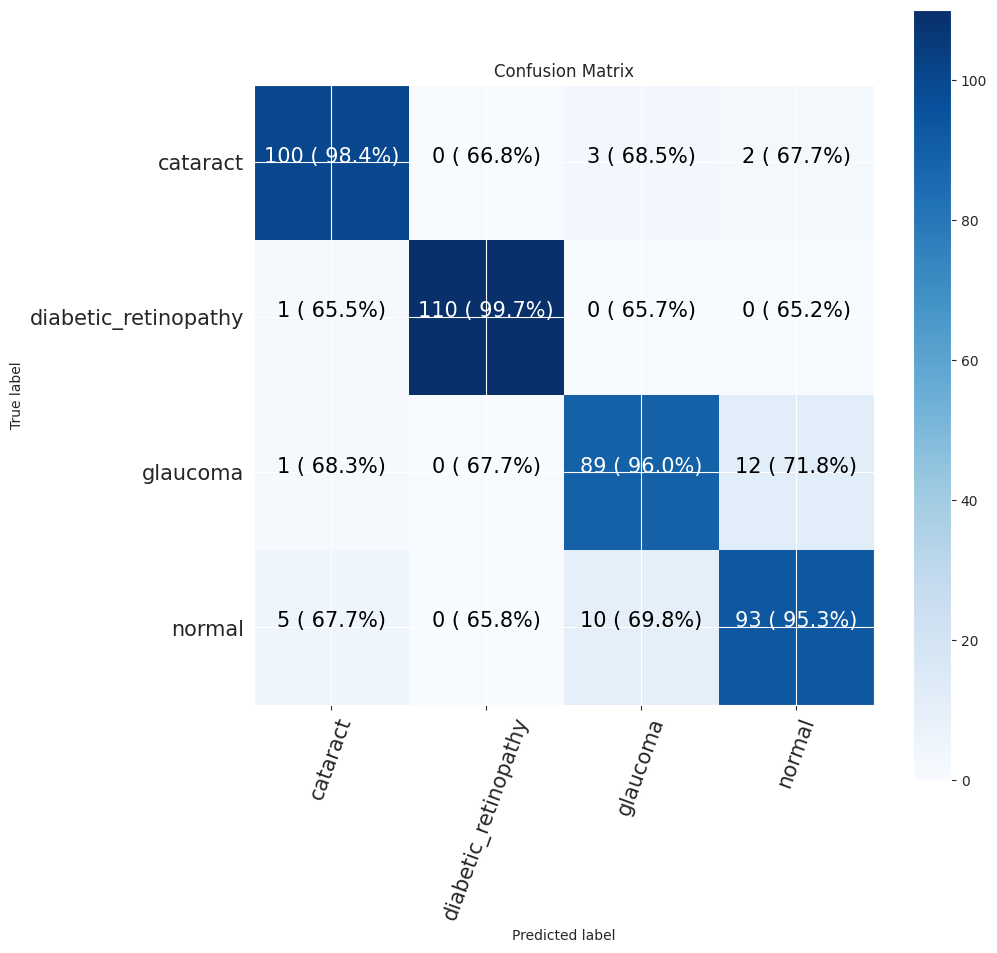

In [33]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


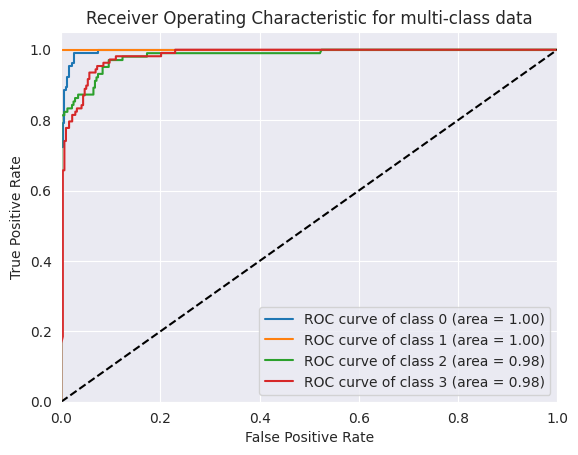

In [34]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [35]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [36]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

171446536/171446536 [==============================] - 5s 0us/step


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



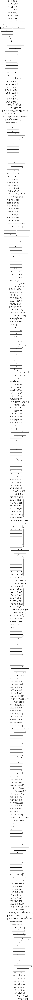

In [37]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [38]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_7 (Dense)             (None, 32)                65568     
                                                           

In [39]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [40]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 161s 730ms/step - loss: 0.6420 - accuracy: 0.7458 - val_loss: 0.4906 - val_accuracy: 0.8162 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 88s 417ms/step - loss: 0.4380 - accuracy: 0.8310 - val_loss: 0.3512 - val_accuracy: 0.8640 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 66s 313ms/step - loss: 0.3797 - accuracy: 0.8535 - val_loss: 0.5305 - val_accuracy: 0.8377 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 57s 272ms/step - loss: 0.3457 - accuracy: 0.8686 - val_loss: 0.3100 - val_accuracy: 0.8831 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 50s 234ms/step - loss: 0.3106 - accuracy: 0.8769 - val_loss: 0.3134 - val_accuracy: 0.8926 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 43s 205ms/step - loss: 0.2932 - accuracy: 0.8903 - val_loss: 0.3570 - val_accuracy: 0.8759 - lr: 0.0010
Epoch 7/20
211/211 [==============================]

ResNet101 Evaluation

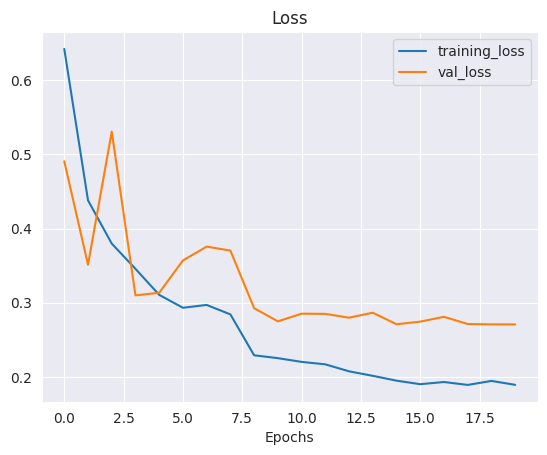

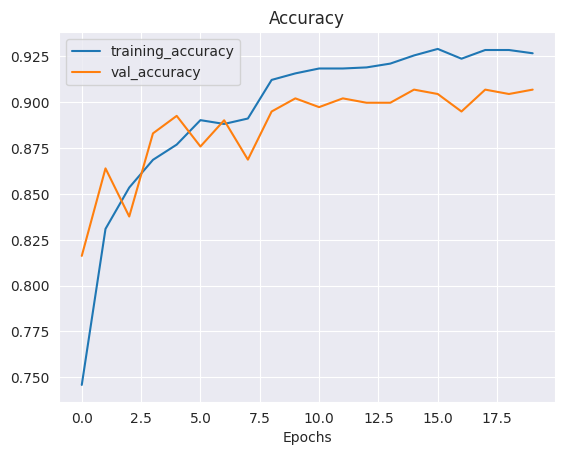

In [41]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 2s 82ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.94       105
           1       0.96      0.98      0.97       111
           2       0.89      0.83      0.86       102
           3       0.84      0.90      0.87       108

    accuracy                           0.91       426
   macro avg       0.91      0.91      0.91       426
weighted avg       0.91      0.91      0.91       426

Specificity: [0.2948328267477204, 0.3438485804416404, 0.24926686217008798, 0.2948328267477204]
Mean Squared Error: : 0.10941219329833984
The average AUC-ROC is 0.9872874063485942


[0.9753086419753086,
 0.6645367412140575,
 0.7009063444108762,
 0.667741935483871,
 0.6574074074074074,
 0.9936102236421726,
 0.6646525679758308,
 0.6483870967741936,
 0.6882716049382716,
 0.6773162939297125,
 0.9486404833836858,
 0.7193548387096774,
 0.6790123456790124,
 0.6645367412140575,
 0.6858006042296072,
 0.964516129032258]

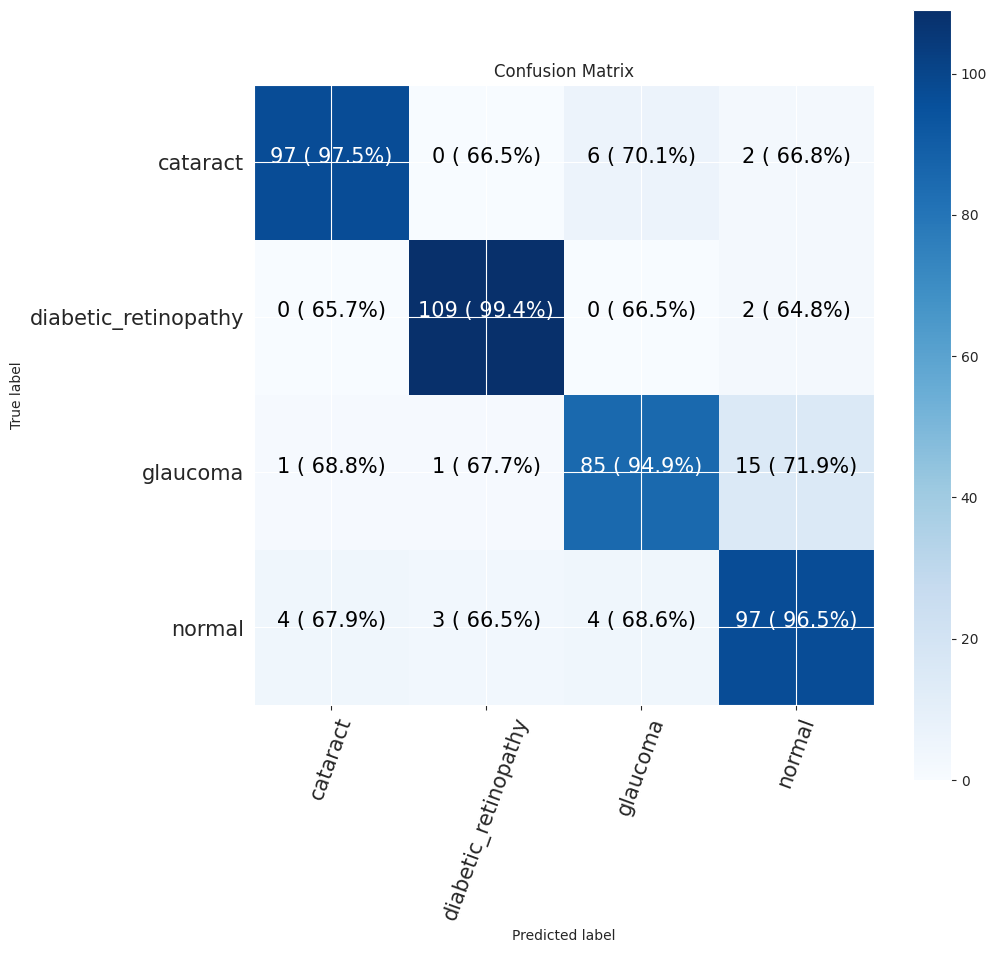

In [42]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


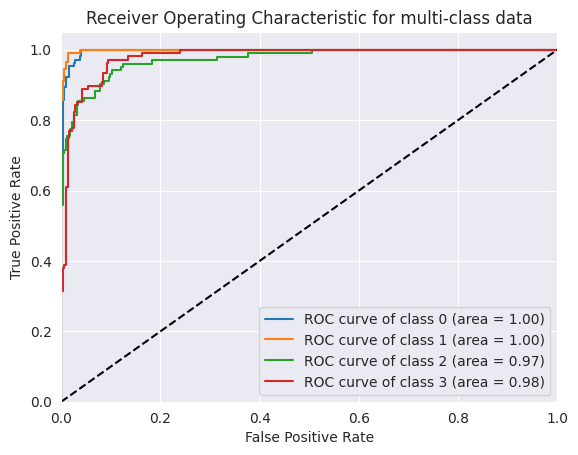

In [43]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch Size: 32**

In [44]:
epoch = 20
batchsize = 32

In [45]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [46]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [47]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_3  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_9 (Dense)             (None, 32)                49184     
                                                           

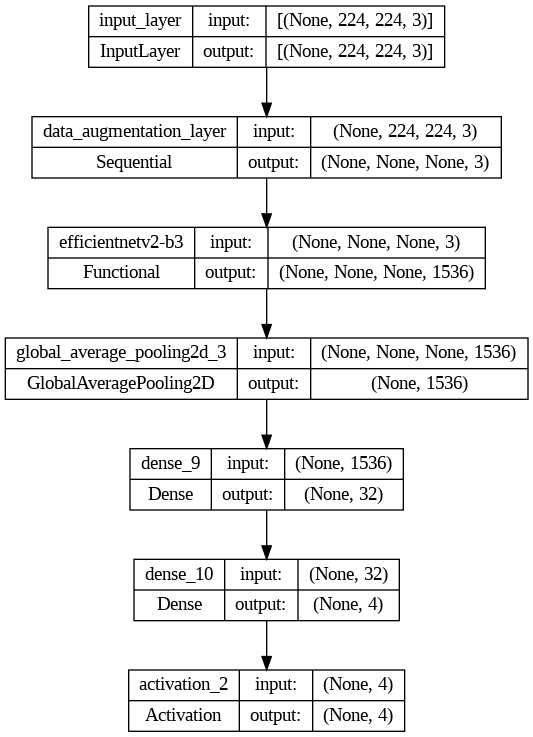

In [48]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [49]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [50]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 101s 858ms/step - loss: 0.6734 - accuracy: 0.7340 - val_loss: 0.5833 - val_accuracy: 0.7757 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 80s 753ms/step - loss: 0.4856 - accuracy: 0.8158 - val_loss: 0.3837 - val_accuracy: 0.8592 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 70s 656ms/step - loss: 0.4174 - accuracy: 0.8405 - val_loss: 0.3427 - val_accuracy: 0.8783 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 68s 638ms/step - loss: 0.4092 - accuracy: 0.8431 - val_loss: 0.3708 - val_accuracy: 0.8592 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 64s 606ms/step - loss: 0.3920 - accuracy: 0.8449 - val_loss: 0.2997 - val_accuracy: 0.8831 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 57s 534ms/step - loss: 0.3490 - accuracy: 0.8657 - val_loss: 0.3503 - val_accuracy: 0.8711 - lr: 0.0010
Epoch 7/20
106/106 [==============================]

EfficientNetV2B3 Evaluation

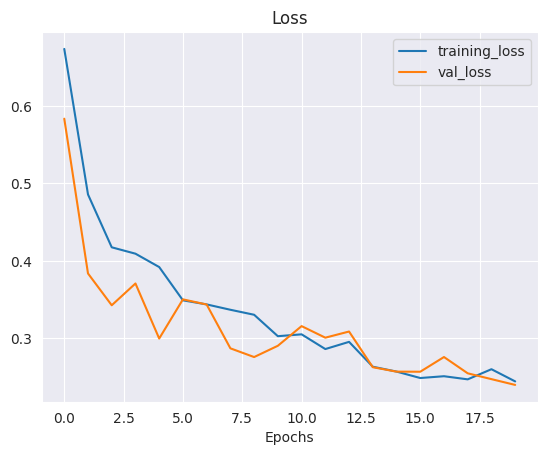

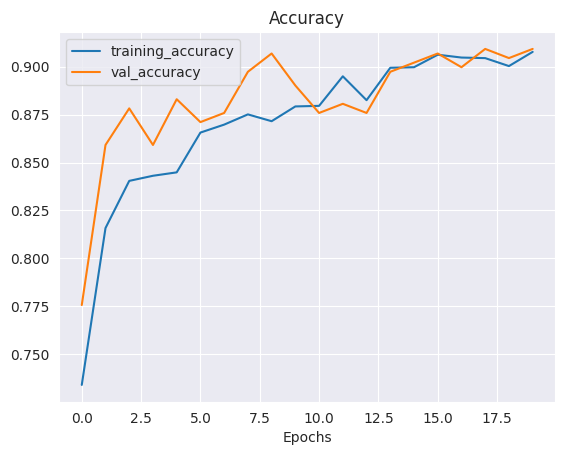

In [51]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 80ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       105
           1       0.97      0.98      0.98       111
           2       0.91      0.83      0.87       102
           3       0.88      0.93      0.90       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.3148148148148148, 0.3438485804416404, 0.24926686217008798, 0.3067484662576687]
Mean Squared Error: : 0.10797746479511261
The average AUC-ROC is 0.9870276498019427


[0.9905956112852664,
 0.6656050955414012,
 0.6906906906906907,
 0.6666666666666666,
 0.6520376175548589,
 0.9936305732484076,
 0.6666666666666666,
 0.6506410256410257,
 0.6927899686520376,
 0.6815286624203821,
 0.948948948948949,
 0.7083333333333334,
 0.664576802507837,
 0.6592356687898089,
 0.6936936936936937,
 0.9743589743589743]

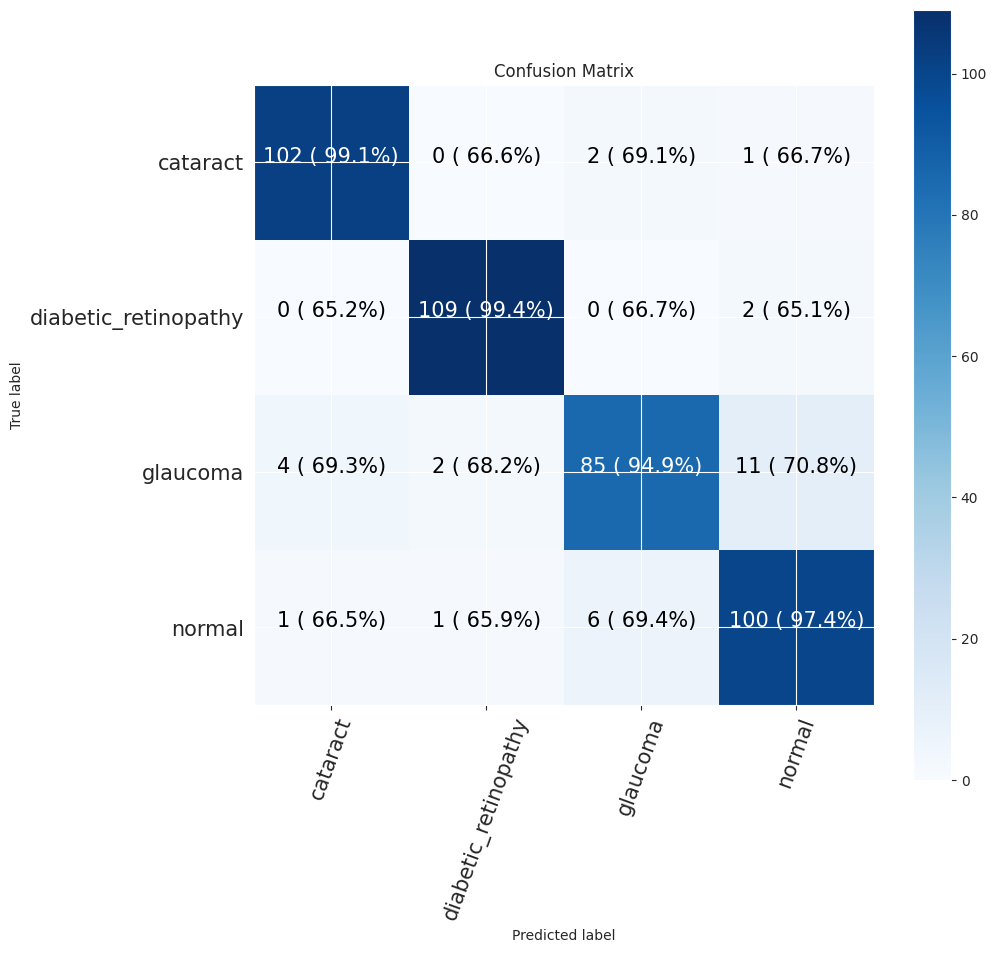

In [52]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


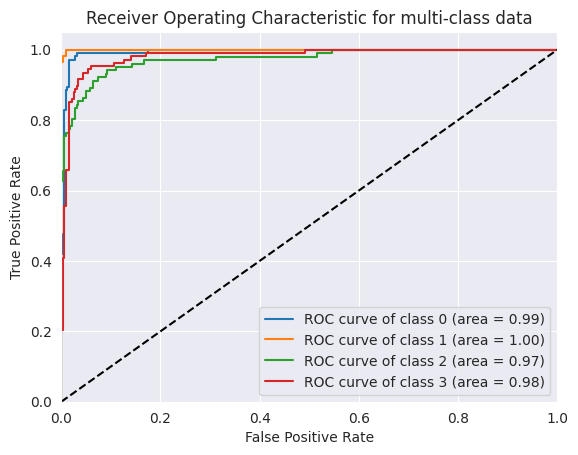

In [53]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [54]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [55]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 26, 26, 128)      

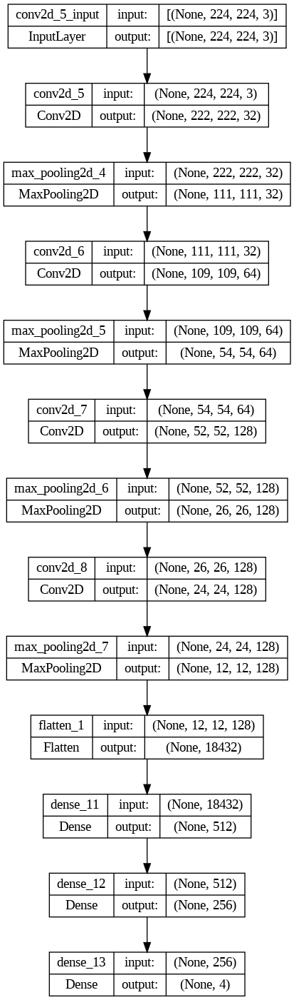

In [56]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [57]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [58]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 7s 39ms/step - loss: 1.2975 - accuracy: 0.5614 - val_loss: 0.3579 - val_accuracy: 0.7017 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 4s 38ms/step - loss: 0.3163 - accuracy: 0.6738 - val_loss: 0.2957 - val_accuracy: 0.7399 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 4s 38ms/step - loss: 0.2937 - accuracy: 0.7052 - val_loss: 0.2891 - val_accuracy: 0.7375 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 4s 38ms/step - loss: 0.2862 - accuracy: 0.7174 - val_loss: 0.2739 - val_accuracy: 0.7470 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 4s 39ms/step - loss: 0.2688 - accuracy: 0.7286 - val_loss: 0.2594 - val_accuracy: 0.7637 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 4s 38ms/step - loss: 0.2633 - accuracy: 0.7384 - val_loss: 0.2599 - val_accuracy: 0.7422 - lr: 0.0010
Epoch 7/20
106/106 [==============================] - 4s 38ms/st

CNN Evaluation

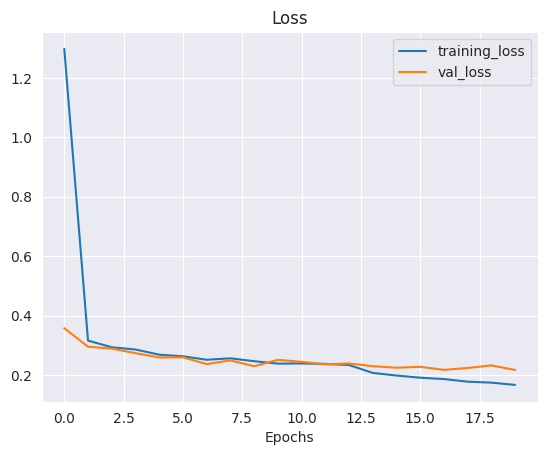

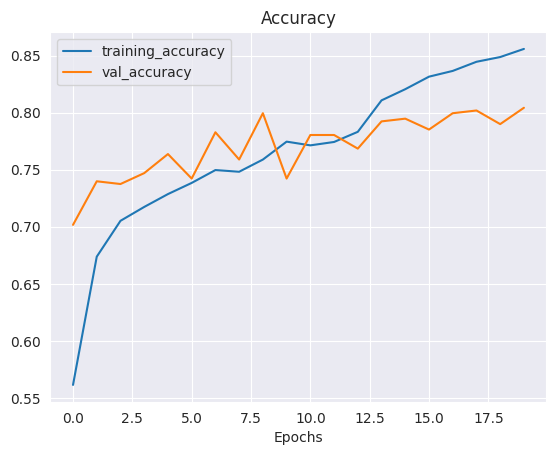

In [59]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 0s 16ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.60      0.61       105
           1       1.00      0.99      1.00       111
           2       0.62      0.51      0.56       102
           3       0.74      0.89      0.81       108

    accuracy                           0.75       426
   macro avg       0.74      0.75      0.74       426
weighted avg       0.75      0.75      0.75       426

Specificity: [0.17355371900826447, 0.34810126582278483, 0.13903743315508021, 0.2909090909090909]
Mean Squared Error: : 0.12916509807109833
The average AUC-ROC is 0.9106542794542053


[0.8699690402476781,
 0.6677215189873418,
 0.7660818713450293,
 0.7037037037037037,
 0.6563467492260062,
 0.9968354430379747,
 0.6783625730994152,
 0.6262626262626263,
 0.7894736842105263,
 0.6772151898734177,
 0.8538011695906432,
 0.7104377104377104,
 0.6842105263157895,
 0.6582278481012658,
 0.7017543859649122,
 0.9595959595959596]

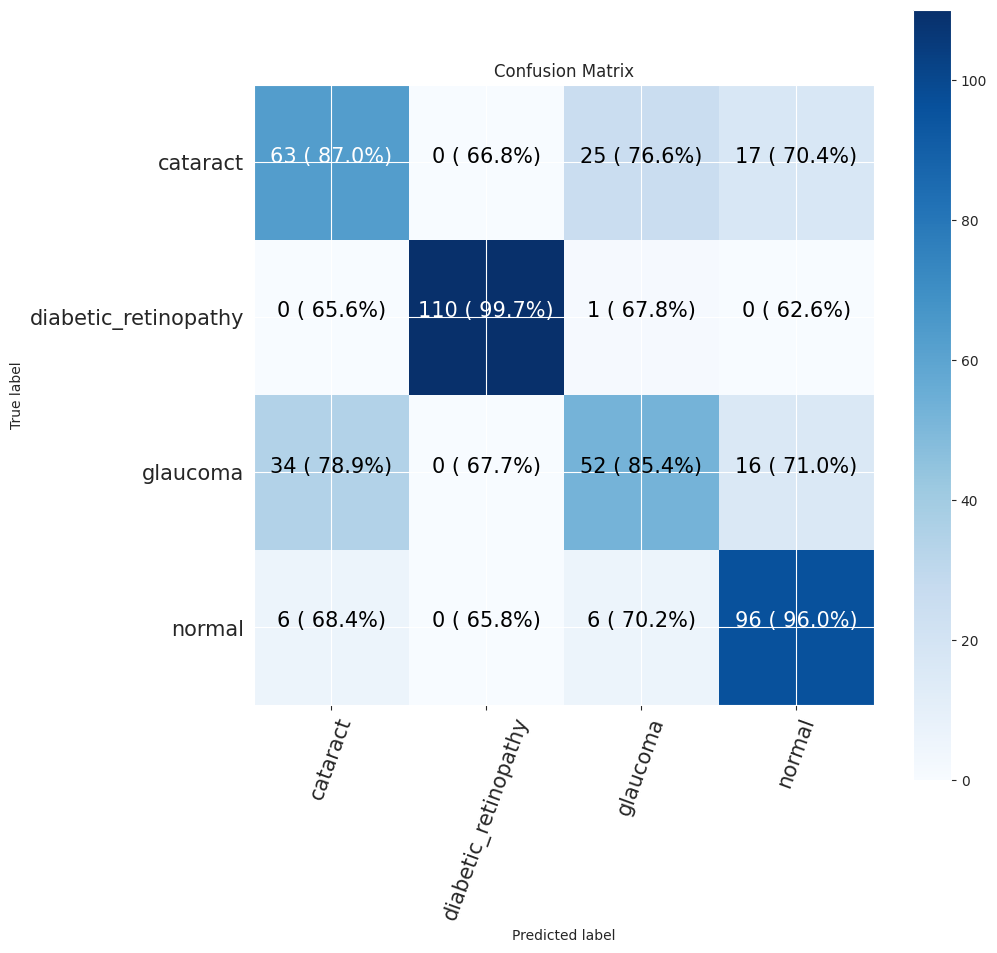

In [60]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


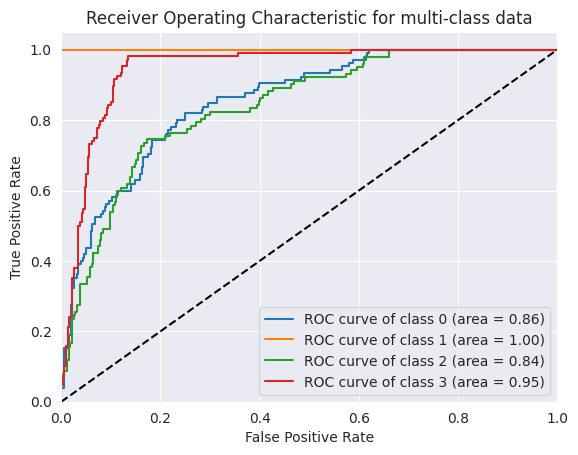

In [61]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [62]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [63]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d_9 (Conv2D)           (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_4  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_14 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_15 (Dense)            (None, 4)                 4100      
                                                           

In [64]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

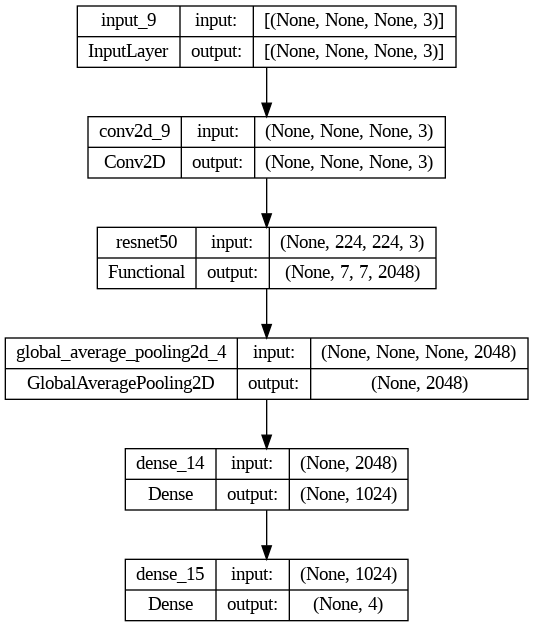

In [65]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [66]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [67]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 37s 272ms/step - loss: 0.2960 - accuracy: 0.7749 - val_loss: 0.1728 - val_accuracy: 0.8711 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 28s 263ms/step - loss: 0.1733 - accuracy: 0.8683 - val_loss: 0.1732 - val_accuracy: 0.8568 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 28s 261ms/step - loss: 0.1495 - accuracy: 0.8858 - val_loss: 0.1421 - val_accuracy: 0.8902 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 28s 262ms/step - loss: 0.1308 - accuracy: 0.8971 - val_loss: 0.1256 - val_accuracy: 0.9093 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 28s 262ms/step - loss: 0.1199 - accuracy: 0.9078 - val_loss: 0.1180 - val_accuracy: 0.9069 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 28s 261ms/step - loss: 0.1080 - accuracy: 0.9199 - val_loss: 0.1155 - val_accuracy: 0.9165 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

ResNet50 Evaluation

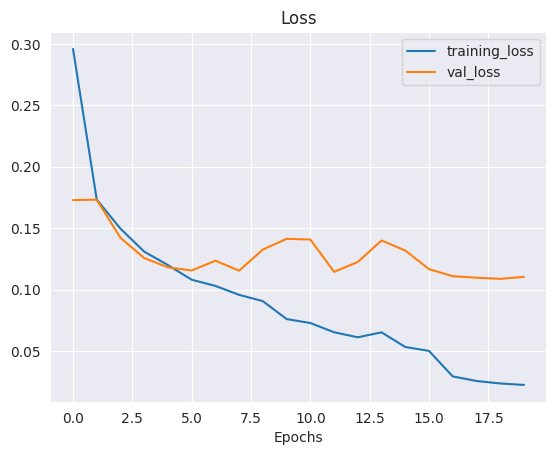

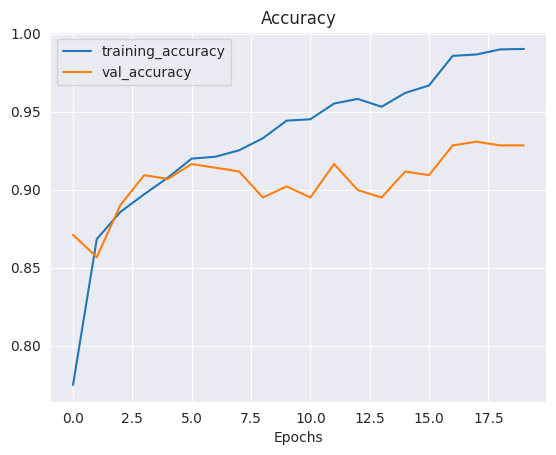

In [68]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 93ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       105
           1       1.00      1.00      1.00       111
           2       0.90      0.89      0.90       102
           3       0.89      0.86      0.87       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.3148148148148148, 0.3523809523809524, 0.2716417910447761, 0.27927927927927926]
Mean Squared Error: : 0.10335962474346161
The average AUC-ROC is 0.987641762946702


[0.9905362776025236,
 0.6666666666666666,
 0.68,
 0.6791277258566978,
 0.6498422712933754,
 1.0,
 0.6584615384615384,
 0.6542056074766355,
 0.6813880126182965,
 0.6761904761904762,
 0.9661538461538461,
 0.7133956386292835,
 0.6782334384858044,
 0.6571428571428571,
 0.6953846153846154,
 0.9532710280373832]

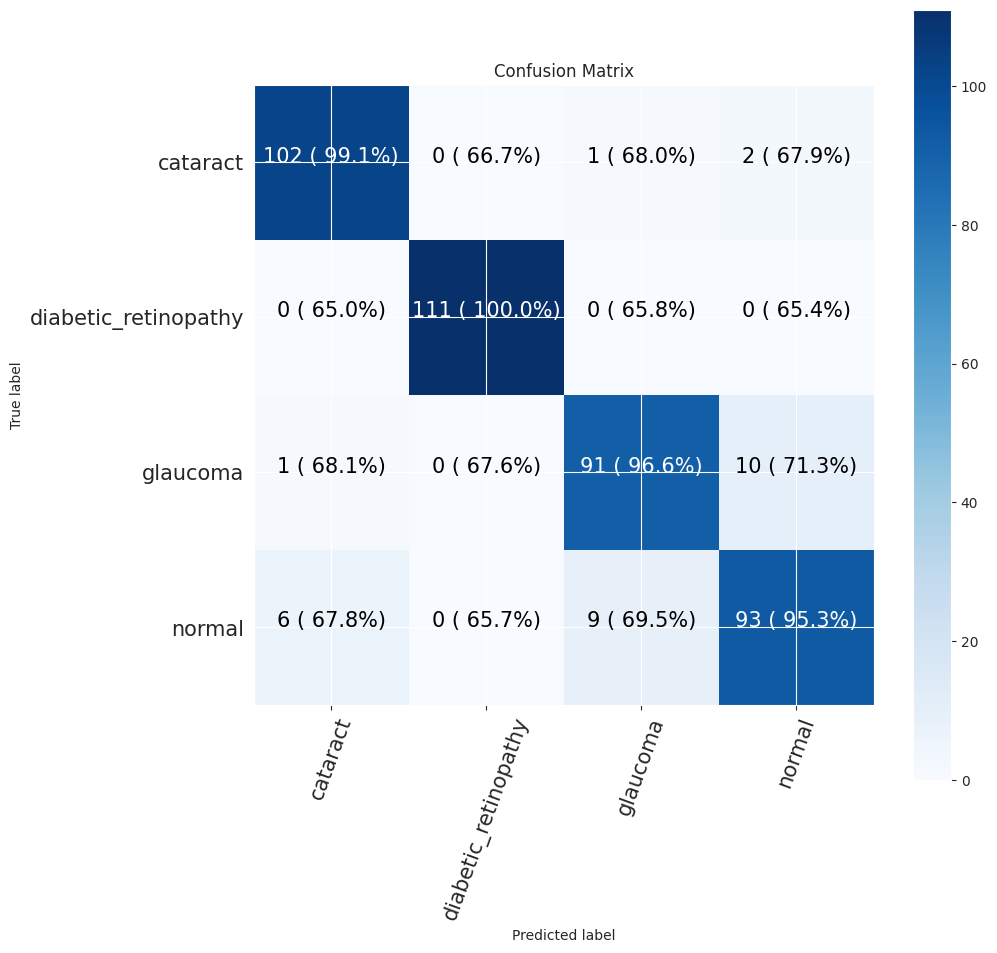

In [69]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


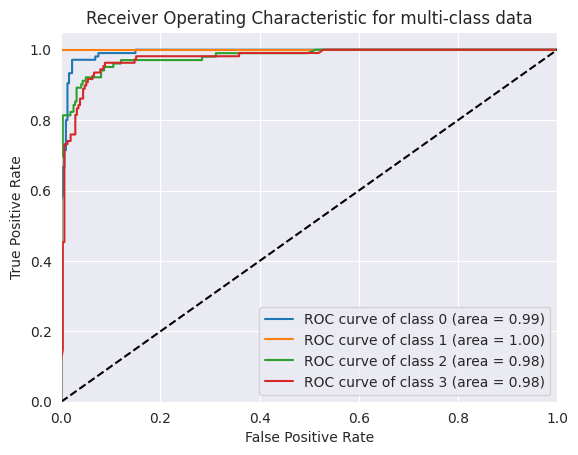

In [70]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [71]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [72]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



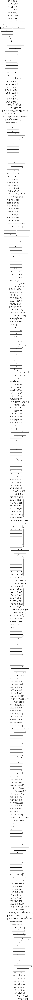

In [73]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [74]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_5  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_16 (Dense)            (None, 32)                65568     
                                                           

In [75]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [76]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 156s 1s/step - loss: 0.6256 - accuracy: 0.7515 - val_loss: 0.4357 - val_accuracy: 0.8353 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 92s 867ms/step - loss: 0.4348 - accuracy: 0.8304 - val_loss: 0.5151 - val_accuracy: 0.7852 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 79s 750ms/step - loss: 0.3953 - accuracy: 0.8440 - val_loss: 0.3448 - val_accuracy: 0.8831 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 72s 673ms/step - loss: 0.3503 - accuracy: 0.8618 - val_loss: 0.4390 - val_accuracy: 0.8544 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 56s 532ms/step - loss: 0.3238 - accuracy: 0.8775 - val_loss: 0.3482 - val_accuracy: 0.8687 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 54s 501ms/step - loss: 0.3050 - accuracy: 0.8817 - val_loss: 0.3230 - val_accuracy: 0.8854 - lr: 0.0010
Epoch 7/20
106/106 [==============================] - 

ResNet101 Evaluation

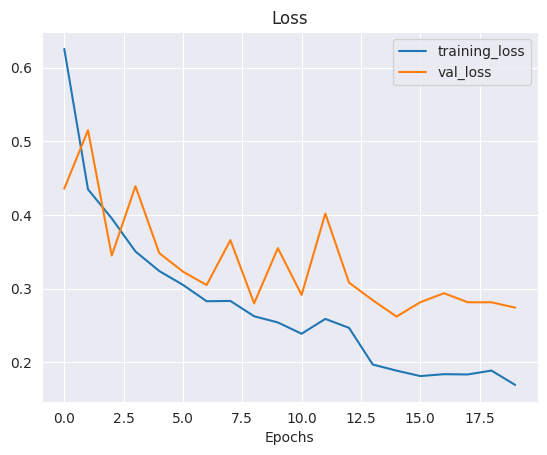

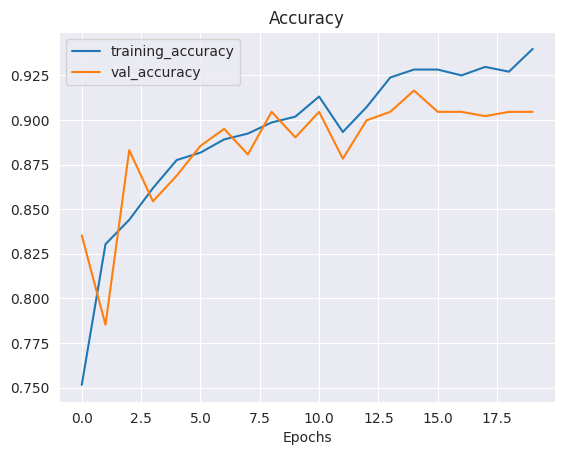

In [77]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 2s 157ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.94       105
           1       0.96      0.99      0.97       111
           2       0.88      0.81      0.85       102
           3       0.84      0.90      0.87       108

    accuracy                           0.91       426
   macro avg       0.91      0.91      0.91       426
weighted avg       0.91      0.91      0.91       426

Specificity: [0.2948328267477204, 0.34810126582278483, 0.24198250728862974, 0.2948328267477204]
Mean Squared Error: : 0.10878465324640274
The average AUC-ROC is 0.9878112690104213


[0.9753086419753086,
 0.662379421221865,
 0.7048192771084337,
 0.6655948553054662,
 0.6574074074074074,
 0.9967845659163987,
 0.6656626506024096,
 0.6463022508038585,
 0.6882716049382716,
 0.6784565916398714,
 0.9427710843373494,
 0.7234726688102894,
 0.6790123456790124,
 0.662379421221865,
 0.6867469879518072,
 0.9646302250803859]

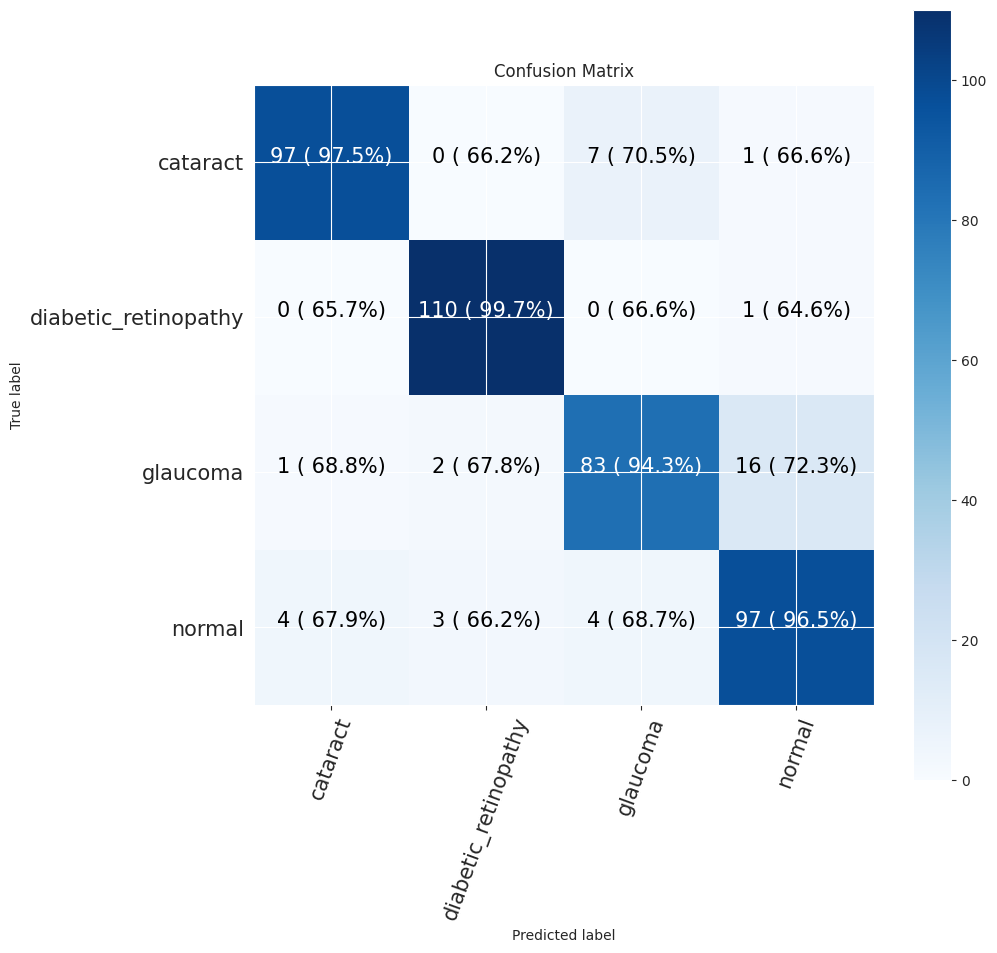

In [78]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


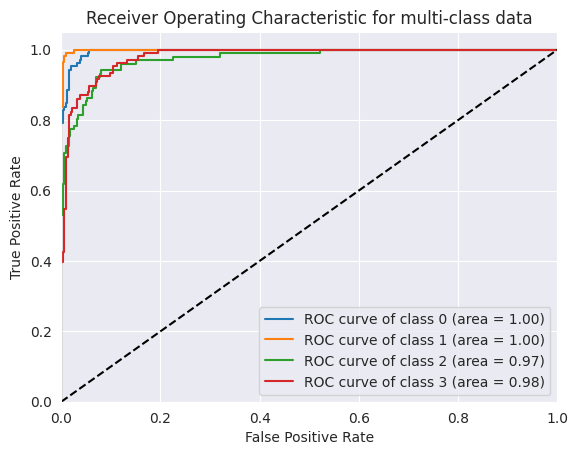

In [79]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch Size: 64**

In [80]:
epoch = 20
batchsize = 64

In [81]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [82]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [83]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_6  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_18 (Dense)            (None, 32)                49184     
                                                           

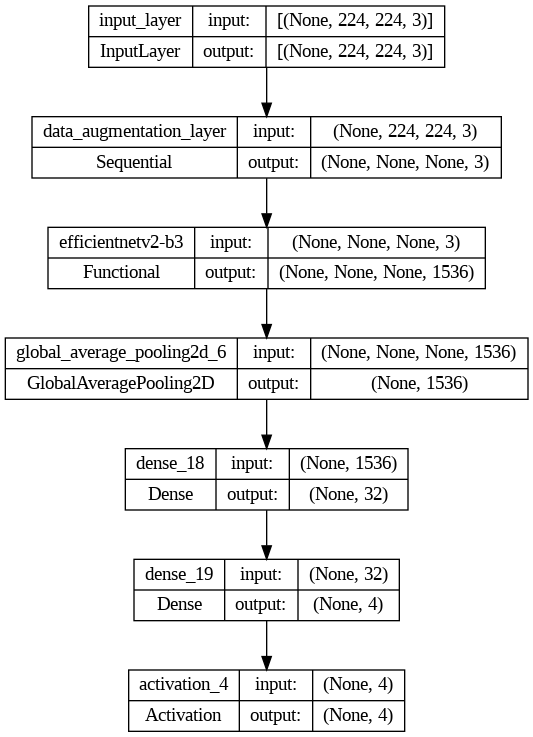

In [84]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [85]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [86]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 105s 2s/step - loss: 0.7709 - accuracy: 0.6824 - val_loss: 0.5212 - val_accuracy: 0.7900 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 80s 2s/step - loss: 0.5215 - accuracy: 0.7915 - val_loss: 0.3793 - val_accuracy: 0.8663 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 75s 1s/step - loss: 0.4513 - accuracy: 0.8283 - val_loss: 0.4815 - val_accuracy: 0.8162 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 68s 1s/step - loss: 0.4410 - accuracy: 0.8298 - val_loss: 0.4087 - val_accuracy: 0.8329 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 70s 1s/step - loss: 0.4029 - accuracy: 0.8443 - val_loss: 0.3763 - val_accuracy: 0.8401 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 64s 1s/step - loss: 0.3708 - accuracy: 0.8618 - val_loss: 0.3164 - val_accuracy: 0.8926 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 56s 1s/step - loss: 0.3591 - 

EfficientNetV2B3 Evaluation

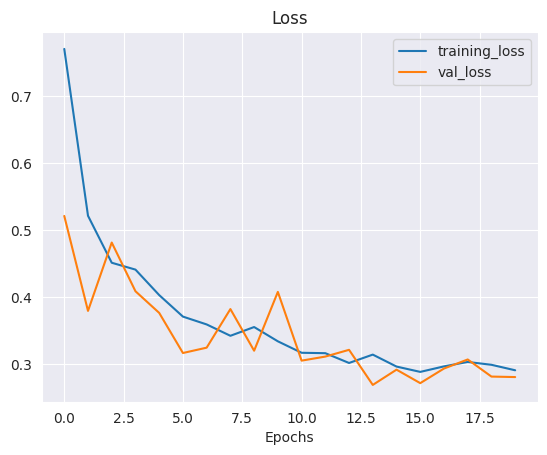

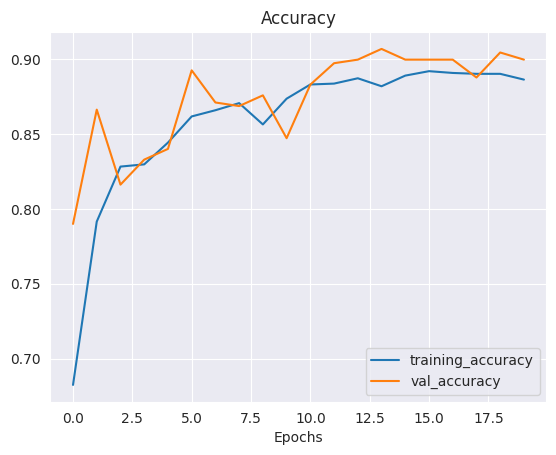

In [87]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 155ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94       105
           1       0.96      0.98      0.97       111
           2       0.95      0.79      0.87       102
           3       0.87      0.94      0.90       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.92      0.92      0.92       426

Specificity: [0.3148148148148148, 0.3438485804416404, 0.23478260869565218, 0.31076923076923074]
Mean Squared Error: : 0.11072558909654617
The average AUC-ROC is 0.9842634572204838


[0.9904761904761905,
 0.6634615384615384,
 0.6950146627565983,
 0.667741935483871,
 0.6476190476190476,
 0.9935897435897436,
 0.6744868035190615,
 0.6483870967741936,
 0.6984126984126984,
 0.6826923076923077,
 0.9384164222873901,
 0.7064516129032258,
 0.6634920634920635,
 0.6602564102564102,
 0.6920821114369502,
 0.9774193548387097]

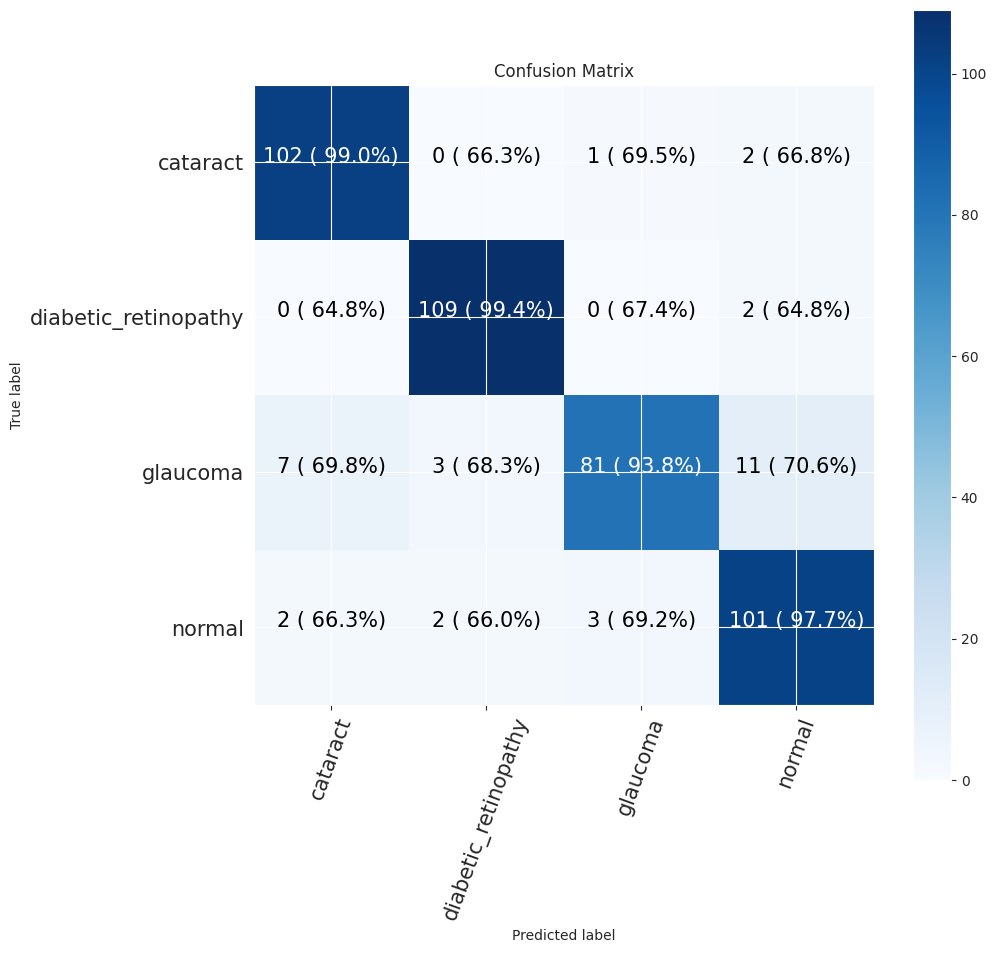

In [88]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


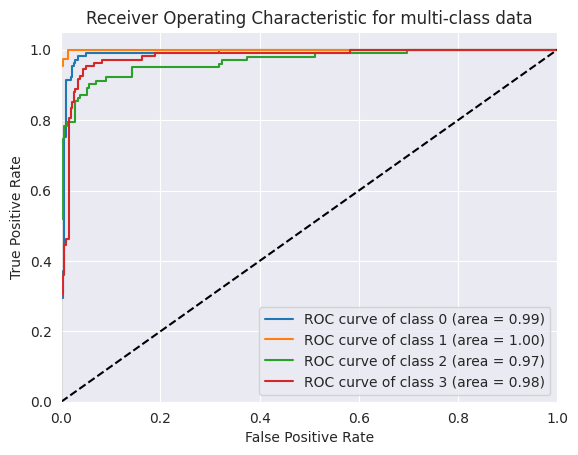

In [89]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [90]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [91]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 26, 26, 128)      

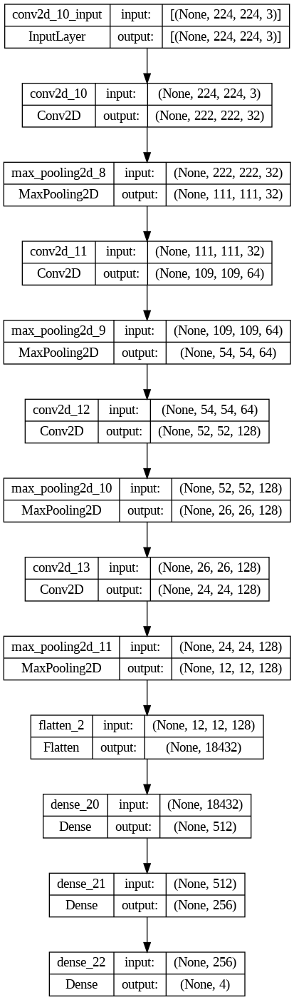

In [92]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [93]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [94]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 11s 120ms/step - loss: 4.0958 - accuracy: 0.5077 - val_loss: 0.4658 - val_accuracy: 0.6158 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 4s 73ms/step - loss: 0.3402 - accuracy: 0.6765 - val_loss: 0.3083 - val_accuracy: 0.7232 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 4s 73ms/step - loss: 0.2642 - accuracy: 0.7550 - val_loss: 0.2364 - val_accuracy: 0.7876 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 4s 73ms/step - loss: 0.2426 - accuracy: 0.7817 - val_loss: 0.2224 - val_accuracy: 0.7828 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 4s 74ms/step - loss: 0.2258 - accuracy: 0.7974 - val_loss: 0.2222 - val_accuracy: 0.7947 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 4s 73ms/step - loss: 0.2076 - accuracy: 0.8215 - val_loss: 0.2254 - val_accuracy: 0.8091 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 4s 73ms/step - loss: 0

CNN Evaluation

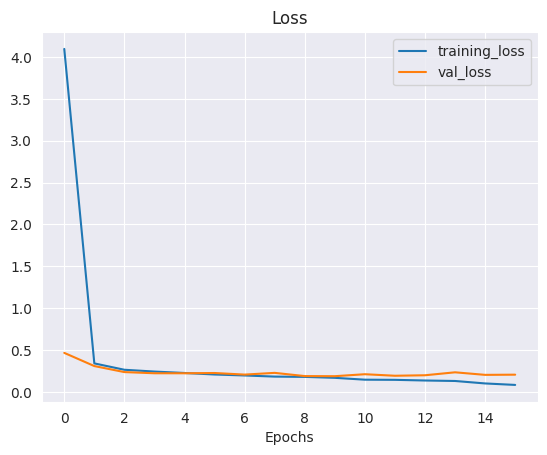

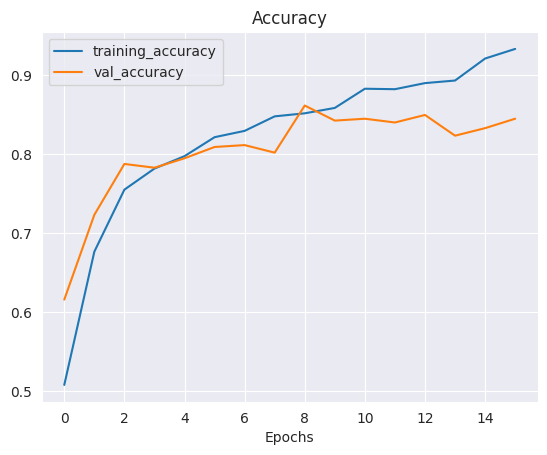

In [95]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 33ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.76      0.79       105
           1       1.00      0.98      0.99       111
           2       0.74      0.75      0.74       102
           3       0.78      0.84      0.81       108

    accuracy                           0.84       426
   macro avg       0.83      0.83      0.83       426
weighted avg       0.84      0.84      0.84       426

Specificity: [0.23121387283236994, 0.3438485804416404, 0.21714285714285714, 0.2716417910447761]
Mean Squared Error: : 0.11726292967796326
The average AUC-ROC is 0.9531165197088955


[0.9237804878048781,
 0.668769716088328,
 0.718266253869969,
 0.6967741935483871,
 0.6646341463414634,
 0.9936908517350158,
 0.6594427244582043,
 0.6419354838709678,
 0.725609756097561,
 0.6782334384858044,
 0.9195046439628483,
 0.7161290322580646,
 0.6859756097560976,
 0.6593059936908517,
 0.7027863777089783,
 0.9451612903225807]

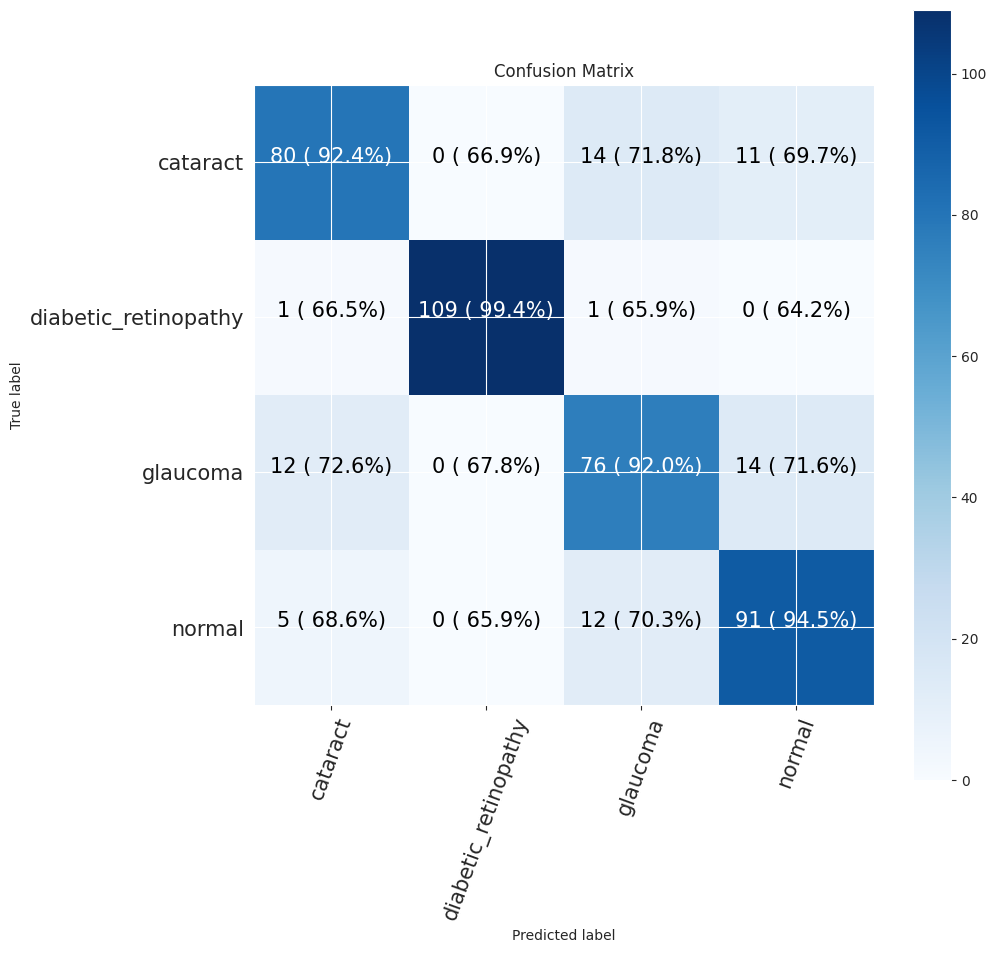

In [96]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


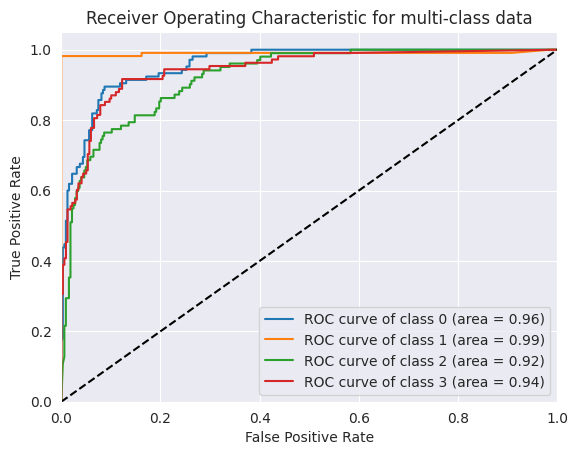

In [97]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [98]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [99]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 conv2d_14 (Conv2D)          (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_7  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_23 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_24 (Dense)            (None, 4)                 4100      
                                                           

In [100]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

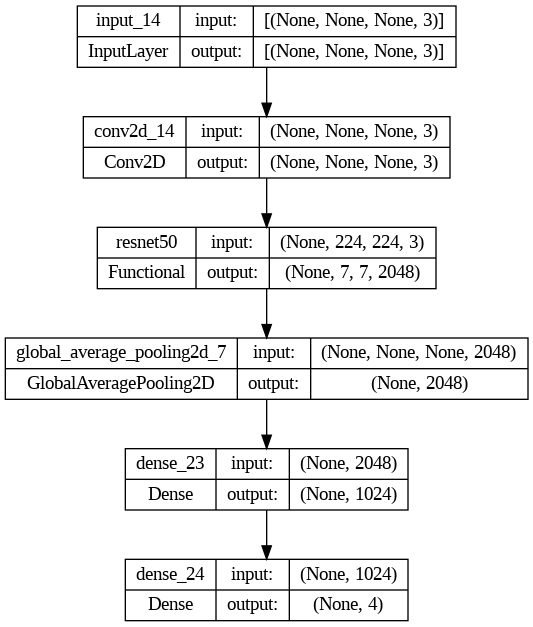

In [101]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [102]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [103]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 47s 679ms/step - loss: 0.3307 - accuracy: 0.7325 - val_loss: 0.2043 - val_accuracy: 0.8544 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 27s 506ms/step - loss: 0.1834 - accuracy: 0.8556 - val_loss: 0.1511 - val_accuracy: 0.8783 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 27s 505ms/step - loss: 0.1543 - accuracy: 0.8814 - val_loss: 0.1642 - val_accuracy: 0.8640 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 27s 509ms/step - loss: 0.1375 - accuracy: 0.8921 - val_loss: 0.1422 - val_accuracy: 0.8878 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 27s 508ms/step - loss: 0.1306 - accuracy: 0.8971 - val_loss: 0.1342 - val_accuracy: 0.9021 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 27s 507ms/step - loss: 0.1011 - accuracy: 0.9318 - val_loss: 0.1420 - val_accuracy: 0.9021 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 27s 509ms/st

ResNet50 Evaluation

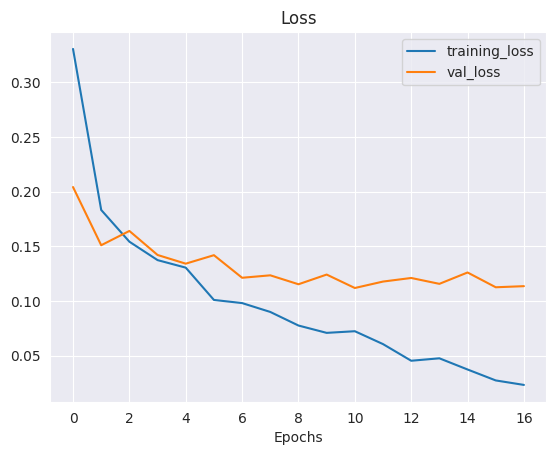

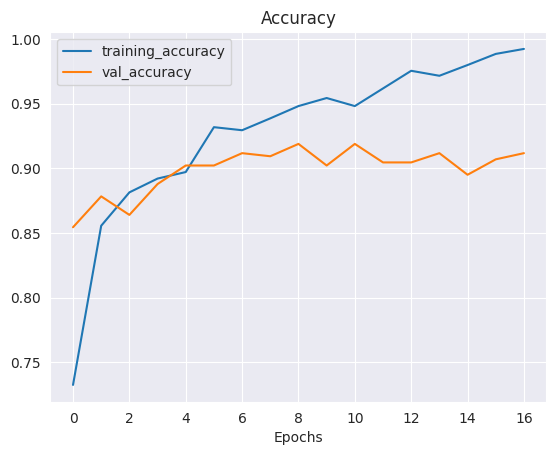

In [104]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 184ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       105
           1       1.00      0.97      0.99       111
           2       0.86      0.91      0.89       102
           3       0.91      0.87      0.89       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.93      0.92      0.93       426

Specificity: [0.30275229357798167, 0.33962264150943394, 0.27927927927927926, 0.28313253012048195]
Mean Squared Error: : 0.10362792760133743
The average AUC-ROC is 0.9860452257990746


[0.9811912225705329,
 0.6698113207547169,
 0.6855345911949685,
 0.6780185758513931,
 0.6520376175548589,
 0.9905660377358491,
 0.6540880503144654,
 0.6625386996904025,
 0.6896551724137931,
 0.6792452830188679,
 0.9716981132075472,
 0.7027863777089783,
 0.677115987460815,
 0.660377358490566,
 0.6886792452830188,
 0.9566563467492261]

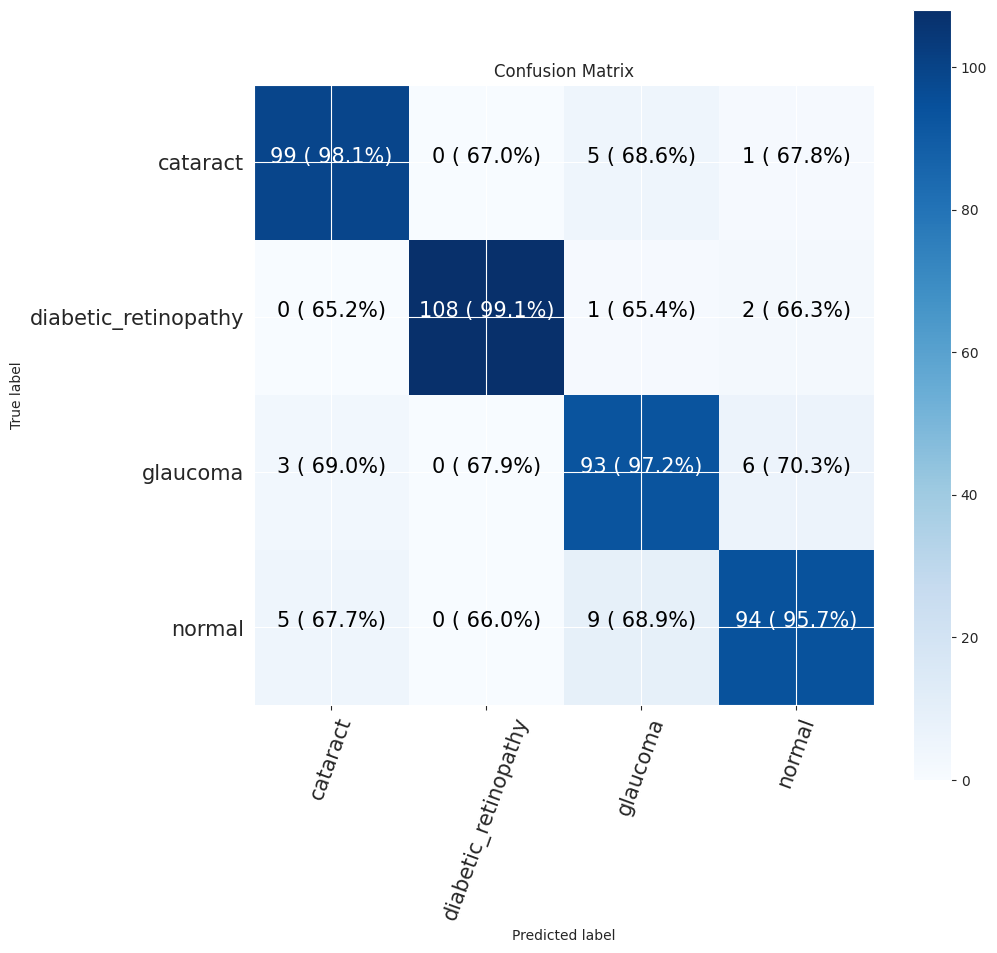

In [105]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


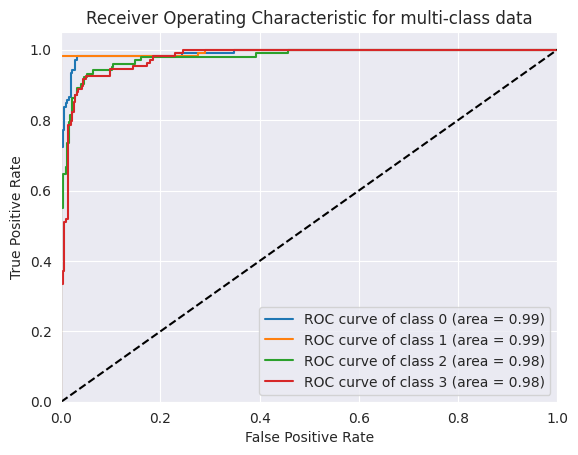

In [106]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [107]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [108]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



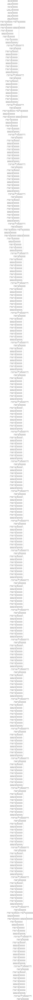

In [109]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [110]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_8  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_25 (Dense)            (None, 32)                65568     
                                                           

In [111]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [112]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 169s 3s/step - loss: 0.7338 - accuracy: 0.7023 - val_loss: 0.5558 - val_accuracy: 0.7876 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 108s 2s/step - loss: 0.4785 - accuracy: 0.8170 - val_loss: 0.4481 - val_accuracy: 0.8377 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 99s 2s/step - loss: 0.4068 - accuracy: 0.8390 - val_loss: 0.4755 - val_accuracy: 0.8186 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 90s 2s/step - loss: 0.3724 - accuracy: 0.8568 - val_loss: 0.3935 - val_accuracy: 0.8449 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 81s 2s/step - loss: 0.3509 - accuracy: 0.8695 - val_loss: 0.4244 - val_accuracy: 0.8377 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 75s 1s/step - loss: 0.3428 - accuracy: 0.8716 - val_loss: 0.3577 - val_accuracy: 0.8592 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 56s 1s/step - loss: 0.3185 -

ResNet101 Evaluation

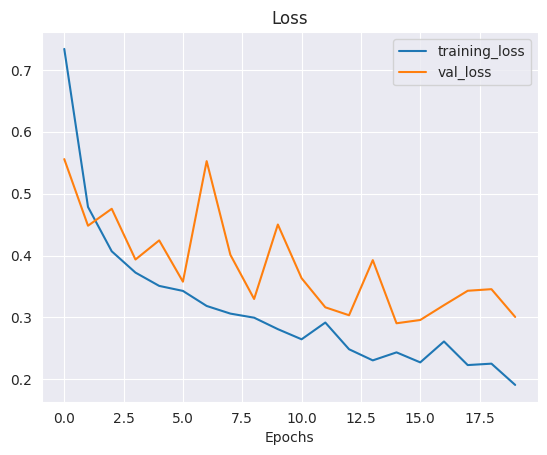

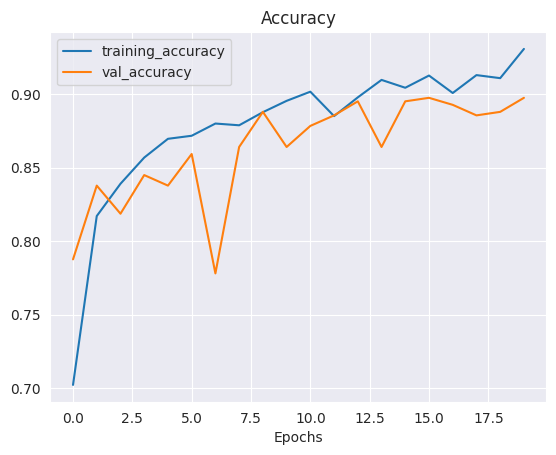

In [113]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 2s 301ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       105
           1       0.97      0.93      0.95       111
           2       0.90      0.82      0.86       102
           3       0.80      0.91      0.85       108

    accuracy                           0.90       426
   macro avg       0.91      0.90      0.90       426
weighted avg       0.91      0.90      0.90       426

Specificity: [0.3067484662576687, 0.3188854489164087, 0.24561403508771928, 0.29878048780487804]
Mean Squared Error: : 0.10953729599714279
The average AUC-ROC is 0.9875023589684552


[0.984472049689441,
 0.671875,
 0.6966966966966966,
 0.6567656765676567,
 0.65527950310559,
 0.975,
 0.6666666666666666,
 0.6600660066006601,
 0.6894409937888198,
 0.68125,
 0.9459459459459459,
 0.7161716171617162,
 0.6708074534161491,
 0.671875,
 0.6906906906906907,
 0.966996699669967]

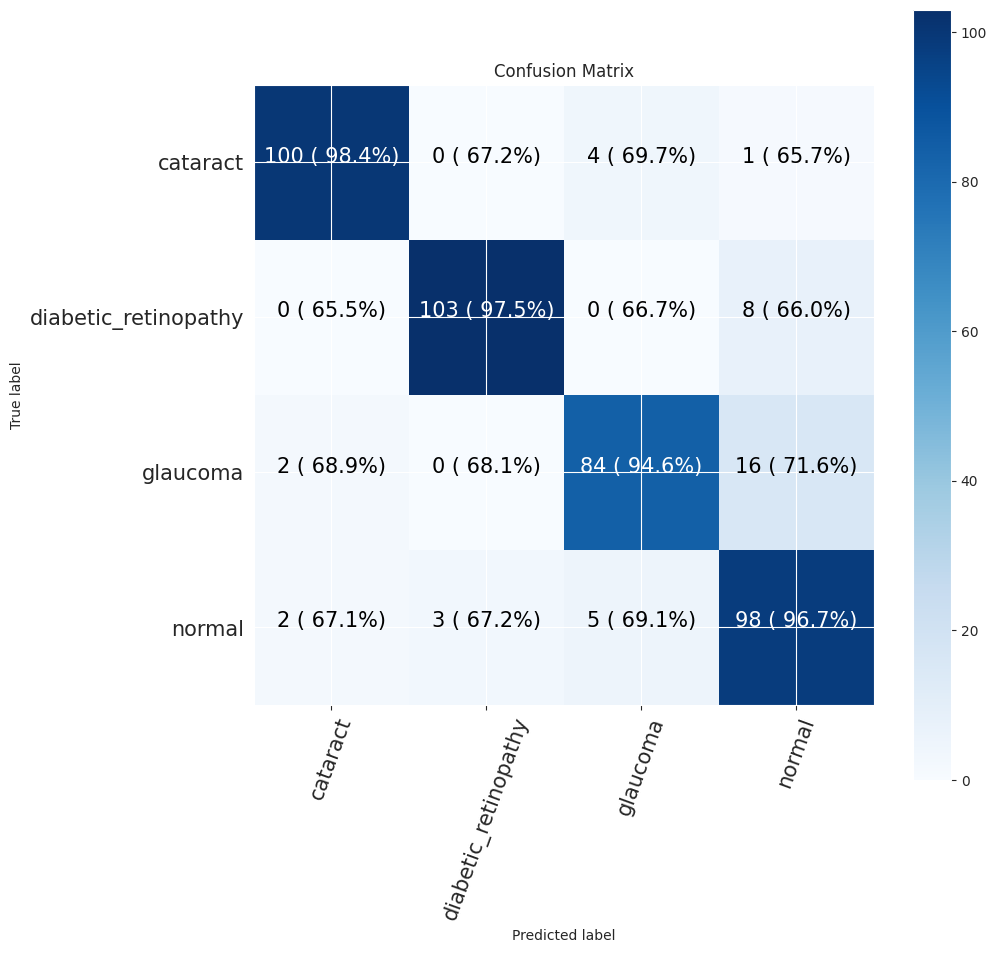

In [114]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


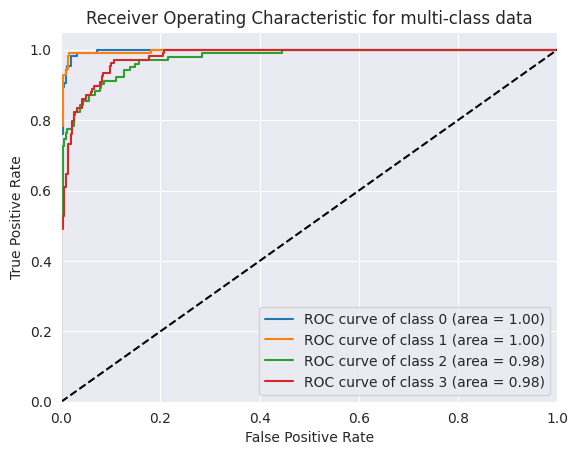

In [115]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()